# Citaciones

In [ ]:
@article{multipers,
  title = {Multipers: {{Multiparameter Persistence}} for {{Machine Learning}}},
  shorttitle = {Multipers},
  author = {Loiseaux, David and Schreiber, Hannah},
  year = {2024},
  month = nov,
  journal = {Journal of Open Source Software},
  volume = {9},
  number = {103},
  pages = {6773},
  issn = {2475-9066},
  doi = {10.21105/joss.06773},
  langid = {english},
}

@article{medmnistv2,
    title={MedMNIST v2-A large-scale lightweight benchmark for 2D and 3D biomedical image classification},
    author={Yang, Jiancheng and Shi, Rui and Wei, Donglai and Liu, Zequan and Zhao, Lin and Ke, Bilian and Pfister, Hanspeter and Ni, Bingbing},
    journal={Scientific Data},
    volume={10},
    number={1},
    pages={41},
    year={2023},
    publisher={Nature Publishing Group UK London}
}

@inproceedings{medmnistv1,
    title={MedMNIST Classification Decathlon: A Lightweight AutoML Benchmark for Medical Image Analysis},
    author={Yang, Jiancheng and Shi, Rui and Ni, Bingbing},
    booktitle={IEEE 18th International Symposium on Biomedical Imaging (ISBI)},
    pages={191--195},
    year={2021}
}



# Algunos `install` e `import`

In [1]:
!pip install gudhi==3.10 numpy==2 cython==3 tbb tbb-devel pytest pot scikit-learn matplotlib joblib tqdm scipy
!pip install pykeops filtration-domination --upgrade

In [2]:
!pip install medmnist
!pip install xgboost
!pip install torch
!pip install pandas
!pip install numpy

In [3]:
!pip install opencv-python

In [4]:
!pip install matplotlib

In [15]:
import gudhi as gd
import numpy as np
from medmnist import BreastMNIST
import matplotlib.pyplot as plt
import torch
import pandas as pd

In [17]:
import multipers as mp
import multipers.filtrations as mpf
from multipers.data.synthetic import three_annulus
from multipers.filtrations.density import KDE
from sklearn.base import BaseEstimator, TransformerMixin

In [19]:
from multipers.filtrations import Cubical
from multipers.filtrations.density import convolution_signed_measures
from multipers.plots import plot_signed_measure, plot_surface
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, FunctionTransformer, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.neighbors import KernelDensity
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC

# Obtención de los datos

Para empezar, es necesario descargar los datos del Dataset con el que trabajaremos. En este caso, descargamos los tres *splits* del Dataset `BreastMNIST`: `train`, `validation` y `test`.

In [25]:
train_medmnist_dataset = BreastMNIST(split='train', download=True)
val_medmnist_dataset = BreastMNIST(split='val', download=True)
test_medmnist_dataset = BreastMNIST(split='test', download=True)

Para trabajar con ellos de forma cómoda, los transformamos en `DataFrame` de la librería `pandas`.

In [28]:
train_df = pd.DataFrame({'img': list(train_medmnist_dataset.imgs),
                         'label': train_medmnist_dataset.labels.reshape(-1)})
val_df = pd.DataFrame({'img': list(val_medmnist_dataset.imgs),
                       'label': val_medmnist_dataset.labels.reshape(-1)})
test_df = pd.DataFrame({'img': list(test_medmnist_dataset.imgs),
                        'label': test_medmnist_dataset.labels.reshape(-1)})

# Preparación de los datos

Para poder usar los datos en el entrenamiento de un modelo de *machine learning*, primero es necesario prepararlos. En esta sección definiremos los métodos derivados de la topología mediante los que obtendremos los invariantes topológicos de las imágenes que nos brindaran información relevante.

In [102]:
# TRANSFORMADORES A CREAR:
# - De imagen a bifiltración HECHO
# - De bifiltración a hilbert signed measure
# - De hilbert signed measure a convolucion
# - De convolucion a vector con max_pool()

# Todo esto luego se lo zampa el SVC/XGBoost

In [30]:
# Para el entrenamiento del modelo, separamos las imágenes de sus etiquetas.

X_train = train_df.drop('label', axis=1).copy()
y_train = train_df['label'].copy()

In [32]:
class Image_to_Bifiltration(BaseEstimator, TransformerMixin):
  def __init__(self):
    return None

  def fit(self, X, y=None):
    return self

  def transform(self, X):
    X = X.copy()

    for i in X.index:
        img = X.iloc[i, 0]
        img = np.array(img)
        pixels = img.reshape(-1, 1)
        
        kde = KernelDensity(
            kernel="gaussian",
            bandwidth=0.04  # tune this!
        )
        kde.fit(pixels)
        log_density = kde.score_samples(pixels)

        density = log_density.reshape(img.shape)

        bifiltration = np.empty(shape=(*[28, 28], 2))
        bifiltration[:, :, 0] = img        # filtro 1: intensidad
        bifiltration[:, :, 1] = -density

        X.iloc[i, 0] = bifiltration

    return X

In [142]:
df_proves = X_train.copy()

In [144]:
transformer = Image_to_Bifiltration()
df_proves = transformer.fit_transform(df_proves)

(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(784, 1)
(

C:\Users\usuario\AppData\Local\Temp\ipykernel_4028\2052711282.py:3: UserWarning: (copy warning) Got a non-vine slicer as an input. Use `vineyard=True` to remove this copy.
  mod = mp.module_approximation(s)


Text(0, 0.5, 'image suplevelset')

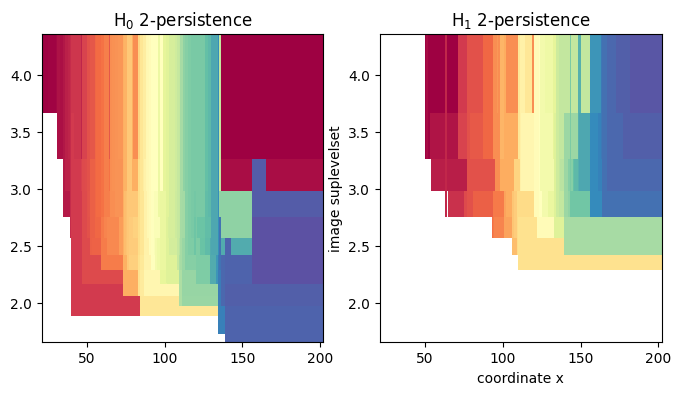

In [146]:
s = Cubical(df_proves.iloc[0, 0])

mod = mp.module_approximation(s)
mod.plot()
plt.xlabel("coordinate x")
plt.ylabel("image suplevelset")

In [34]:
class Bifiltration_to_HSignedMeasure_0(BaseEstimator, TransformerMixin):
  def __init__(self):
    return None

  def fit(self, X, y=None):
    return self

  def transform(self, X):
    X = X.copy()

    for i in X.index:
        bifiltration = X.iloc[i, 0]
        s = Cubical(bifiltration)
        _s =(
        mp.Slicer(s, vineyard=False, backend = "gudhicohomology")
        #.minpres(degree)
        .grid_squeeze(strategy="regular_closest", resolution=100) # coarsen the filtration
        ) ## reduces the complex via a minimal presentation, on a coarsened grid
        
        smh = mp.signed_measure(_s, invariant="hilbert", degree=0,plot=True)
        
        X.iloc[i, 0] = smh

    return X

In [36]:
class Bifiltration_to_HSignedMeasure_1(BaseEstimator, TransformerMixin):
  def __init__(self):
    return None

  def fit(self, X, y=None):
    return self

  def transform(self, X):
    X = X.copy()

    for i in X.index:
        bifiltration = X.iloc[i, 0]
        s = Cubical(bifiltration)
        _s =(
        mp.Slicer(s, vineyard=False, backend = "gudhicohomology")
        #.minpres(degree)
        .grid_squeeze(strategy="regular_closest", resolution=100) # coarsen the filtration
        ) ## reduces the complex via a minimal presentation, on a coarsened grid
        
        smh = mp.signed_measure(_s, invariant="hilbert", degree=1,plot=True)
        
        X.iloc[i, 0] = smh

    return X

C:\Users\usuario\anaconda3\Lib\site-packages\multipers\plots.py:176: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


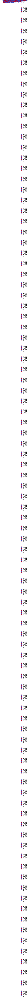

In [172]:
transformer_2 = Bifiltration_to_HSignedMeasure_0()

df_proves = transformer_2.fit_transform(df_proves)

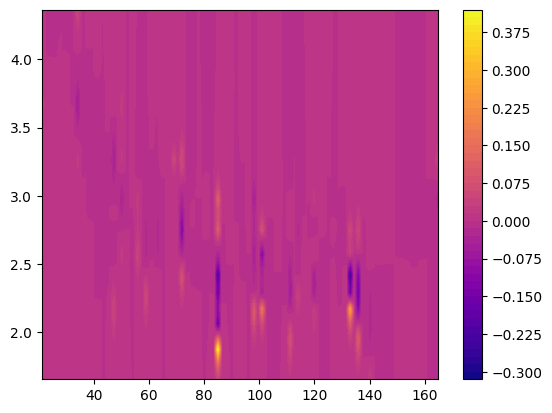

In [173]:
img_grid = mp.grids.compute_grid(df_proves.iloc[0, 0], strategy="regular", resolution=100)
img = convolution_signed_measures([df_proves.iloc[0, 0]], img_grid, bandwidth=.1, flatten=False, kernel = "exponential", backend="sklearn")
stuff= plot_surface(img_grid, img.squeeze(), cmap="plasma")
plt.colorbar(stuff)

In [38]:
class HSignedMeasure_to_Convolution(BaseEstimator, TransformerMixin):
  def __init__(self):
    return None

  def fit(self, X, y=None):
    return self

  def transform(self, X):
    X = X.copy()

    for i in X.index:
        smh = X.iloc[i, 0]

        img_grid = mp.grids.compute_grid(smh, strategy="regular", resolution=100)
        img = convolution_signed_measures([smh], img_grid, bandwidth=.1, flatten=False, kernel = "exponential", backend="sklearn")
        
        X.iloc[i, 0] = img.squeeze()

    return X

In [178]:
transformer_3 = HSignedMeasure_to_Convolution()

df_proves = transformer_3.fit_transform(df_proves)

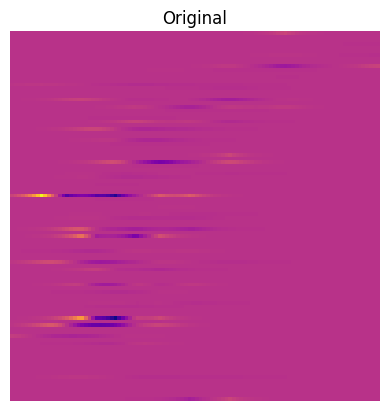

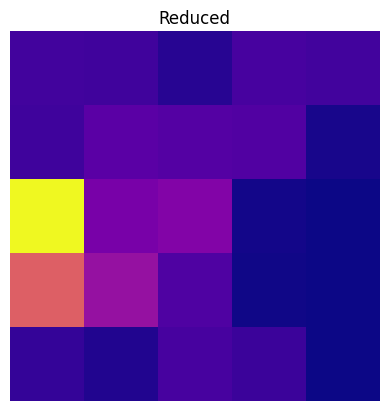

In [179]:
def max_pool_20x20_loop(img):
    pooled = np.zeros((5, 5))

    for i in range(5):
        for j in range(5):
            block = img[i*20:(i+1)*20, j*20:(j+1)*20]
            pooled[i, j] = np.max(block)

    return pooled

max_p_img = max_pool_20x20_loop(df_proves.iloc[0, 0])

plt.imshow(df_proves.iloc[0, 0], cmap='plasma')  # .squeeze() elimina la dimensión 1
plt.title(f"Original")
plt.axis('off')
plt.show()
plt.imshow(max_p_img, cmap='plasma')  # .squeeze() elimina la dimensión 1
plt.title(f"Reduced")
plt.axis('off')
plt.show()

In [132]:
class Convolution_to_Vector(BaseEstimator, TransformerMixin):
  def __init__(self):
    return None

  def fit(self, X, y=None):
    return self

  def transform(self, X):
    X = X.copy()
    muestras = X.shape[0]
    X_final = np.zeros((muestras, 25))

    for i in X.index:
        img = X.iloc[i, 0]

        pooled = np.zeros((5, 5))

        for k in range(5):
            for j in range(5):
                block = img[k*20:(k+1)*20, j*20:(j+1)*20]
                pooled[k, j] = np.max(block)

        X_final[i, :] = pooled.flatten()

    return X_final

In [229]:
transformer_4 = Convolution_to_Vector()

df_proves = transformer_4.fit_transform(df_proves)

## Creación de los `Pipeline`

In [134]:
pipeline_hsm_0 = Pipeline([
            ('Bifiltration', Image_to_Bifiltration()),
            ('HSM_0', Bifiltration_to_HSignedMeasure_0()),
            ('Convolution', HSignedMeasure_to_Convolution()),
            ('Vectorization', Convolution_to_Vector()),
            ('simple_imputer', SimpleImputer(strategy='mean')),
            ('scaler', StandardScaler())
])

pipeline_hsm_1 = Pipeline([
            ('Bifiltration', Image_to_Bifiltration()),
            ('HSM_1', Bifiltration_to_HSignedMeasure_1()),
            ('Convolution', HSignedMeasure_to_Convolution()),
            ('Vectorization', Convolution_to_Vector()),
            ('simple_imputer', SimpleImputer(strategy='mean')),
            ('scaler', StandardScaler())
])

In [136]:
full_pipeline = ColumnTransformer([
          ('pipeline_degree_0', pipeline_hsm_0, ['img']),
          ('pipeline_degree_1', pipeline_hsm_1, ['img'])
])

C:\Users\usuario\anaconda3\Lib\site-packages\multipers\plots.py:176: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
C:\Users\usuario\anaconda3\Lib\site-packages\multipers\plots.py:176: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


(546, 50)

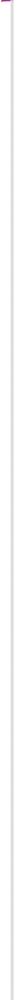

In [138]:
X_train_prepared = full_pipeline.fit_transform(X_train)

X_train_prepared.shape

# Entrenamiento de los modelos

Una vez tenemos las imágenes analizadas y nuestros datos estan en forma de vector, podemos utilizarlos para entrenar y evaluar diversos modelos de *machine learning*. En este código, entrenaremos un `SupportVectorMachine` y un `XGBoost`.

## `SupportVectorMachine`

In [144]:
svc_rbf = SVC(kernel='rbf', probability=True, class_weight='balanced')

svc_rbf.fit(X_train_prepared, y_train)

,"C C: float, default=1.0Regularization parameter. The strength of the regularization isinversely proportional to C. Must be strictly positive. The penaltyis a squared l2 penalty. For an intuitive visualization of the effectsof scaling the regularization parameter C, see:ref:`sphx_glr_auto_examples_svm_plot_svm_scale_c.py`.",1.0
,"kernel kernel: {'linear', 'poly', 'rbf', 'sigmoid', 'precomputed'} or callable, default='rbf'Specifies the kernel type to be used in the algorithm. Ifnone is given, 'rbf' will be used. If a callable is given it is used topre-compute the kernel matrix from data matrices; that matrix should bean array of shape ``(n_samples, n_samples)``. For an intuitivevisualization of different kernel types see:ref:`sphx_glr_auto_examples_svm_plot_svm_kernels.py`.",'rbf'
,"degree degree: int, default=3Degree of the polynomial kernel function ('poly').Must be non-negative. Ignored by all other kernels.",3
,"gamma gamma: {'scale', 'auto'} or float, default='scale'Kernel coefficient for 'rbf', 'poly' and 'sigmoid'.- if ``gamma='scale'`` (default) is passed then it uses 1 / (n_features * X.var()) as value of gamma,- if 'auto', uses 1 / n_features- if float, must be non-negative... versionchanged:: 0.22 The default value of ``gamma`` changed from 'auto' to 'scale'.",'scale'
,"coef0 coef0: float, default=0.0Independent term in kernel function.It is only significant in 'poly' and 'sigmoid'.",0.0
,"shrinking shrinking: bool, default=TrueWhether to use the shrinking heuristic.See the :ref:`User Guide `.",True
,"probability probability: bool, default=FalseWhether to enable probability estimates. This must be enabled priorto calling `fit`, will slow down that method as it internally uses5-fold cross-validation, and `predict_proba` may be inconsistent with`predict`. Read more in the :ref:`User Guide `.",True
,"tol tol: float, default=1e-3Tolerance for stopping criterion.",0.001
,"cache_size cache_size: float, default=200Specify the size of the kernel cache (in MB).",200
,"class_weight class_weight: dict or 'balanced', default=NoneSet the parameter C of class i to class_weight[i]*C forSVC. If not given, all classes are supposed to haveweight one.The ""balanced"" mode uses the values of y to automatically adjustweights inversely proportional to class frequencies in the input dataas ``n_samples / (n_classes * np.bincount(y))``.",'balanced'
,"verbose verbose: bool, default=FalseEnable verbose output. Note that this setting takes advantage of aper-process runtime setting in libsvm that, if enabled, may not workproperly in a multithreaded context.",False


In [146]:
# Àrea sota la ROC
from sklearn.metrics import roc_auc_score
train_proba_svc = svc_rbf.predict_proba(X_train_prepared)[:,1]

roc_auc_train_svc = roc_auc_score(y_train, train_proba_svc)
print("Area under the ROC:", roc_auc_train_svc)

Area under the ROC: 0.9570780693229672


In [150]:
# Altres mètriques
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
train_pred_svc = (train_proba_svc >= 0.5).astype(bool)

train_svc_ac = accuracy_score(y_train, train_pred_svc)
train_svc_prec = precision_score(y_train, train_pred_svc)
train_svc_rec = recall_score(y_train, train_pred_svc)
train_svc_f1 = f1_score(y_train, train_pred_svc)
print("Accuracy:", train_svc_ac)
print("Precision:", train_svc_prec)
print("Recall:", train_svc_rec)
print("f1:", train_svc_f1)

Accuracy: 0.9029304029304029
Precision: 0.8878923766816144
Recall: 0.9924812030075187
f1: 0.9372781065088758


## `XGBoost`

In [154]:
param_grid = {
    'n_estimators': [100, 200, 400],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.05, 0.1],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0, 1, 5],
    'reg_alpha': [0, 0.1, 1]
}

xgb_clf = xgb.XGBClassifier(random_state = 42)
grid_search = GridSearchCV(xgb_clf, param_grid, cv=5, scoring='roc_auc') # RANDOM SEED = 42
grid_search.fit(X_train_prepared, y_train)

,"estimator estimator: estimator objectThis is assumed to implement the scikit-learn estimator interface.Either estimator needs to provide a ``score`` function,or ``scoring`` must be passed.","XGBClassifier...ree=None, ...)"
,"param_grid param_grid: dict or list of dictionariesDictionary with parameters names (`str`) as keys and lists ofparameter settings to try as values, or a list of suchdictionaries, in which case the grids spanned by each dictionaryin the list are explored. This enables searching over any sequenceof parameter settings.","{'colsample_bytree': [0.6, 0.8, ...], 'gamma': [0, 1, ...], 'learning_rate': [0.01, 0.05, ...], 'max_depth': [3, 5, ...], ...}"
,"scoring scoring: str, callable, list, tuple or dict, default=NoneStrategy to evaluate the performance of the cross-validated model onthe test set.If `scoring` represents a single score, one can use:- a single string (see :ref:`scoring_string_names`);- a callable (see :ref:`scoring_callable`) that returns a single value;- `None`, the `estimator`'s :ref:`default evaluation criterion ` is used.If `scoring` represents multiple scores, one can use:- a list or tuple of unique strings;- a callable returning a dictionary where the keys are the metric names and the values are the metric scores;- a dictionary with metric names as keys and callables as values.See :ref:`multimetric_grid_search` for an example.",'roc_auc'
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details... versionchanged:: v0.20 `n_jobs` default changed from 1 to None",None
,"refit refit: bool, str, or callable, default=TrueRefit an estimator using the best found parameters on the wholedataset.For multiple metric evaluation, this needs to be a `str` denoting thescorer that would be used to find the best parameters for refittingthe estimator at the end.Where there are considerations other than maximum score inchoosing a best estimator, ``refit`` can be set to a function whichreturns the selected ``best_index_`` given ``cv_results_``. In thatcase, the ``best_estimator_`` and ``best_params_`` will be setaccording to the returned ``best_index_`` while the ``best_score_``attribute will not be available.The refitted estimator is made available at the ``best_estimator_``attribute and permits using ``predict`` directly on this``GridSearchCV`` instance.Also for multiple metric evaluation, the attributes ``best_index_``,``best_score_`` and ``best_params_`` will only be available if``refit`` is set and all of them will be determined w.r.t this specificscorer.See ``scoring`` parameter to know more about multiple metricevaluation.See :ref:`sphx_glr_auto_examples_model_selection_plot_grid_search_digits.py`to see how to design a custom selection strategy using a callablevia `refit`.See :ref:`this example`for an example of how to use ``refit=callable`` to balance modelcomplexity and cross-validated score... versionchanged:: 0.20 Support for callable added.",True
,"cv cv: int, cross-validation generator or an iterable, default=NoneDetermines the cross-validation splitting strategy.Possible inputs for cv are:- None, to use the default 5-fold cross validation,- integer, to specify the number of folds in a `(Stratified)KFold`,- :term:`CV splitter`,- An iterable yielding (train, test) splits as arrays of indices.For integer/None inputs, if the estimator is a classifier and ``y`` iseither binary or multiclass, :class:`StratifiedKFold` is used. In allother cases, :class:`KFold` is used. These splitters are instantiatedwith `shuffle=False` so the splits will be the same across calls.Refer :ref:`User Guide ` for the variouscross-validation strategies that can be used here... versionchanged:: 0.22 ``cv`` default value if None changed from 3-fold to 5-fold.",5
,"verbose verbose: intControls the verbosity: the higher, the more messages.- >1 : the computation time for each fold a

In [155]:
print("Mejores parámetros:")
print(grid_search.best_params_)
print("Mejor puntuación:")
print(grid_search.best_score_)

Mejores parámetros:
{'colsample_bytree': 0.6, 'gamma': 0, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 400, 'reg_alpha': 1, 'subsample': 0.6}
Mejor puntuación:
0.703683107813182


In [156]:
xgb_clf = grid_search.best_estimator_

In [157]:
# Àrea sota la ROC

train_proba_xgb = xgb_clf.predict_proba(X_train_prepared)[:,1]

roc_auc_train_xgb = roc_auc_score(y_train, train_proba_xgb)
print("Area under the ROC:", roc_auc_train_xgb)

Area under the ROC: 0.9741360203229161


In [189]:
# Altres mètriques

train_pred_xgb = (train_proba_xgb >= 0.5).astype(bool)

train_xgb_ac = accuracy_score(y_train, train_pred_xgb)
train_xgb_prec = precision_score(y_train, train_pred_xgb)
train_xgb_rec = recall_score(y_train, train_pred_xgb)
train_xgb_f1 = f1_score(y_train, train_pred_xgb)
print("Accuracy:", train_xgb_ac)
print("Precision:", train_xgb_prec)
print("Recall:", train_xgb_rec)
print("f1:", train_xgb_f1)

Accuracy: 0.8846153846153846
Precision: 0.8652173913043478
Recall: 0.9974937343358395
f1: 0.9266589057043073


# Validación de los modelos

C:\Users\usuario\anaconda3\Lib\site-packages\multipers\plots.py:176: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
C:\Users\usuario\anaconda3\Lib\site-packages\multipers\plots.py:176: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


(78, 50)

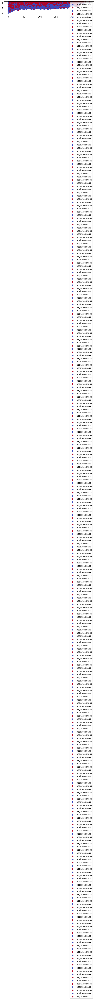

In [164]:
X_val = val_df.drop('label', axis=1).copy()
y_val = val_df['label'].copy()

X_val_prepared = full_pipeline.transform(X_val)
X_val_prepared.shape

## `SupportVectorMachine`

In [166]:
# Àrea sota la ROC

val_proba_svc = svc_rbf.predict_proba(X_val_prepared)[:, 1]

roc_auc_val_svc = roc_auc_score(y_val, val_proba_svc)
print("Area under the ROC:", roc_auc_val_svc)

Area under the ROC: 0.6357560568086883


In [195]:
# Altres mètriques

val_pred_svc = (val_proba_svc >= 0.6).astype(bool)

val_svc_ac = accuracy_score(y_val, val_pred_svc)
val_svc_prec = precision_score(y_val, val_pred_svc)
val_svc_rec = recall_score(y_val, val_pred_svc)
val_svc_f1 = f1_score(y_val, val_pred_svc)
print("Accuracy:", val_svc_ac)
print("Precision:", val_svc_prec)
print("Recall:", val_svc_rec)
print("f1:", val_svc_f1)

Accuracy: 0.7051282051282052
Precision: 0.7428571428571429
Recall: 0.9122807017543859
f1: 0.8188976377952756


## `XGBoost`

In [169]:
# Àrea sota la ROC

val_proba_xgb = xgb_clf.predict_proba(X_val_prepared)[:, 1]

roc_auc_val_xgb = roc_auc_score(y_val, val_proba_xgb)
print("Area under the ROC:", roc_auc_val_xgb)

Area under the ROC: 0.6115288220551378


In [203]:
# Altres mètriques

val_pred_xgb = (val_proba_xgb >= 0.5).astype(bool)

val_xgb_ac = accuracy_score(y_val, val_pred_xgb)
val_xgb_prec = precision_score(y_val, val_pred_xgb)
val_xgb_rec = recall_score(y_val, val_pred_xgb)
val_xgb_f1 = f1_score(y_val, val_pred_xgb)
print("Accuracy:", val_xgb_ac)
print("Precision:", val_xgb_prec)
print("Recall:", val_xgb_rec)
print("f1:", val_xgb_f1)

Accuracy: 0.7307692307692307
Precision: 0.75
Recall: 0.9473684210526315
f1: 0.8372093023255814


# Resultados en el test

C:\Users\usuario\anaconda3\Lib\site-packages\multipers\plots.py:176: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
C:\Users\usuario\anaconda3\Lib\site-packages\multipers\plots.py:176: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


(156, 50)

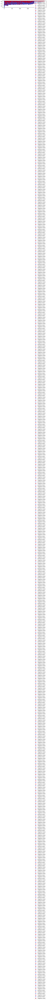

In [178]:
X_test = test_df.drop('label', axis=1).copy()
y_test = test_df['label'].copy()

X_test_prepared = full_pipeline.transform(X_test)
X_test_prepared.shape

## `SupportVectorMachine`

In [179]:
# Àrea sota la ROC

test_proba_svc = svc_rbf.predict_proba(X_test_prepared)[:, 1]

roc_auc_test_svc = roc_auc_score(y_test, test_proba_svc)
print("Area under the ROC:", roc_auc_test_svc)

Area under the ROC: 0.6522556390977444


In [209]:
# Altres mètriques

test_pred_svc = (test_proba_svc >= 0.5).astype(bool)

test_svc_ac = accuracy_score(y_test, test_pred_svc)
test_svc_prec = precision_score(y_test, test_pred_svc)
test_svc_rec = recall_score(y_test, test_pred_svc)
test_svc_f1 = f1_score(y_test, test_pred_svc)
print("Accuracy:", test_svc_ac)
print("Precision:", test_svc_prec)
print("Recall:", test_svc_rec)
print("f1:", test_svc_f1)

Accuracy: 0.7307692307692307
Precision: 0.7337662337662337
Recall: 0.9912280701754386
f1: 0.8432835820895522


## `XGBoost`

In [182]:
# Àrea sota la ROC

test_proba_xgb = xgb_clf.predict_proba(X_test_prepared)[:, 1]

roc_auc_test_xgb = roc_auc_score(y_test, test_proba_xgb)
print("Area under the ROC:", roc_auc_test_xgb)

Area under the ROC: 0.6194653299916457


In [217]:
# Altres mètriques

test_pred_xgb = (test_proba_xgb >= 0.5).astype(bool)

test_xgb_ac = accuracy_score(y_test, test_pred_xgb)
test_xgb_prec = precision_score(y_test, test_pred_xgb)
test_xgb_rec = recall_score(y_test, test_pred_xgb)
test_xgb_f1 = f1_score(y_test, test_pred_xgb)
print("Accuracy:", test_xgb_ac)
print("Precision:", test_xgb_prec)
print("Recall:", test_xgb_rec)
print("f1:", test_xgb_f1)

Accuracy: 0.7371794871794872
Precision: 0.7449664429530202
Recall: 0.9736842105263158
f1: 0.844106463878327
